# Importações e Bibliotecas

In [4]:
import random # Operações de aleatoriedade
import sys # Operações do sistema (print, etc)
import statistics # Operações de estatística

In [5]:
from market import Market, Produto # Importa a classe Market e a classe Produto

In [6]:
# Importações para construção gráfica do melhor indivíduo e do gráfico de evolução
from PIL import Image
from IPython.display import display
import plotly.graph_objects as go

# Valores Estáticos

In [7]:
CART: dict = {
    'Altura': 65,
    'Largura': 50,
    'Comprimento': 80,
    'PesoMaximo': 460*1000
}
CART['Capacidade'] = CART['Altura'] * CART['Largura'] * CART['Comprimento']

CART

{'Altura': 65,
 'Largura': 50,
 'Comprimento': 80,
 'PesoMaximo': 460000,
 'Capacidade': 260000}

In [8]:
MAX_MONEY: float = 1750.0
MAX_ITEMS: int = 100
MAX_CARTS: int = 200
MAX_GENERATIONS: int = 1000
BESTS: int = 5

In [9]:
MED_PRICE: float = MAX_MONEY/MAX_ITEMS
f"Preço Médio por Produto: R${MED_PRICE:.2f}"

'Preço Médio por Produto: R$17.50'

# Funções

In [10]:
m: Market = Market(r"..\data\produtos2.csv")
print(m)

Market Info
7823 products loaded.


In [11]:
def mosaic(cart: list[Produto], row_quantity: int = 5, image_size: tuple[int, int] = (300, 300)) -> None:
    """Cria um mosaico com as imagens dos produtos do carrinho"""
    
    # Lista o objeto das imagens
    images: list[Image] = [product.show(popup=False).resize(image_size) for product in cart]
    
    # Calcula o tamanho do mosaico
    mosaic_size: tuple[int, int] = (image_size[0]*row_quantity, image_size[1]*((len(images)//row_quantity)+1))
    
    # Cria a imagem do mosaico
    mosaic: Image = Image.new('RGB', mosaic_size)
    
    # Coloca as imagens no mosaico
    for i, image in enumerate(images):
        mosaic.paste(image, (image_size[0]*(i%row_quantity), image_size[1]*(i//row_quantity)))
    
    # Exibe o mosaico
    display(mosaic) 

In [12]:
def plot_generations(data: dict[int, dict[str, float]]) -> None:
    """Plota um gráfico com os valores de cada geração"""
    
    # Extrai as iterações e os valores
    iterations: list = list(data.keys())
    max_values: list = [data[i]['max'] for i in iterations]
    min_values: list = [data[i]['min'] for i in iterations]
    avg_values: list = [data[i]['med'] for i in iterations]

    # Cria o objeto gráfico
    fig = go.Figure()

    # Adiciona as linhas para cada variável
    fig.add_trace(go.Scatter(x=iterations, y=max_values, mode='lines+markers', name='Max', line=dict(color="#a90000")))
    fig.add_trace(go.Scatter(x=iterations, y=min_values, mode='lines+markers', name='Min', line=dict(color="#007d1d")))
    fig.add_trace(go.Scatter(x=iterations, y=avg_values, mode='lines+markers', name='Medio', line=dict(color="#356fa8")))

    # Adiciona título e rótulos
    fig.update_layout(
                    title='Gráfico de Gerações',
                    xaxis_title='Iteração',
                    yaxis_title='Valores',
                    yaxis_type='log',  #! Define o eixo y como logarítmico
                    template='plotly'
                )

    # Exibe o gráfico
    fig.show()

In [13]:
def calculate_regression(data: dict, last: int = globals()['MAX_GENERATIONS']//5) -> float:
    """ Calcula a regressão linear dos valores de uma lista de gerações das últimas N gerações """
    
    # Se a quantidade de dados for menor que o mínimo, retorna infinito
    if len(data) < last:
        return float("inf")
    
    else:
        values: list = list(data.values())[-last:]
        return statistics.stdev([value.get('min') for value in values])

In [14]:
def instanciate(cart: list[int]) -> list[Produto]:
    """Instancia uma lista de produtos a partir de uma lista de IDs"""
    
    return [m.get(i) for i in cart]

In [15]:
def info(cart: list[int]) -> str:
    """ Retorna uma string com as informações do indivíduo/carrinho """
    nota: float = avaliar(cart)
    cart: list[Produto] = instanciate(cart)
    return f"[INDIVÍDUO]\n\
Nota: {nota}\n\
Tamanho: {len(cart)}\n\n\
[INFORMAÇÕES DO CARRINHO]\n\
Preço Total: R${sum([product.price for product in cart]):.2f}\n\
Peso Total: {sum([product.weight for product in cart])/1000:.2f}g\n\
Volume Total: {sum([product.volume for product in cart]):.2f}cm³\n\
Preço médio: R${sum([product.price for product in cart])/len(cart)}\n\n\
[PRODUTOS]\n\
Menor preço: R${min([product.price for product in cart])}\n\
Maior preço: R${max([product.price for product in cart])}\n\
Menor peso: {min([product.weight for product in cart])}g\n\
Maior peso: {max([product.weight for product in cart])}g\n\
Menor volume: {min([product.volume for product in cart])}cm³\n\
Maior volume: {max([product.volume for product in cart])}cm³\n\n\
[CATEGORIAS]:\n{"\n".join([f"- {category}: {[product.category for product in cart].count(category)}" for category in set([product.category for product in cart])])}\n\n\
[LISTAGEM]\n{"\n".join([f"{product.name} \t R${product.price:.2f} \t {product.weight:.2f}g \t {product.volume:.2f}cm³" for product in cart])}\n\
"

# Genético

### Geração de Indivíduos

In [16]:
def gerar_carrinho(tamanho: int = globals()['MAX_ITEMS']) -> list[int]:
    compra = []

    while len(compra) < tamanho:
        item: int = m.random()
        compra.append(item)
        
    return compra

In [17]:
c: list[int] = gerar_carrinho()
c

[477572,
 1613340,
 334118,
 458824,
 290998,
 1572797,
 1615420,
 1606434,
 470307,
 1616105,
 109066,
 354499,
 392461,
 31639,
 653609,
 425214,
 263638,
 426764,
 159497,
 440606,
 1618477,
 1616633,
 168873,
 1850,
 128632,
 1058550,
 528838,
 472881,
 409373,
 345291,
 1619119,
 1548841,
 361293,
 401850,
 1616289,
 401849,
 181126,
 73773,
 1609402,
 1619426,
 466107,
 438484,
 1568232,
 659742,
 8488,
 478921,
 1574772,
 1446163,
 148386,
 279928,
 407707,
 435271,
 1457113,
 31818,
 690651,
 1374124,
 310907,
 1624119,
 356426,
 440616,
 217857,
 598284,
 385168,
 449283,
 7614,
 82294,
 1624030,
 87285,
 695154,
 1615224,
 1568595,
 1386435,
 16777,
 477544,
 1129980,
 115258,
 71229,
 271505,
 1387081,
 85350,
 1566598,
 1406950,
 342623,
 1419558,
 460707,
 425261,
 137224,
 265880,
 366007,
 430626,
 45440,
 467363,
 409167,
 441805,
 1619342,
 411986,
 472638,
 459469,
 197339,
 1614966]

### Geração de População Inicial

In [ ]:
def gerar_populacao(tamanho: int = globals()['MAX_CARTS']) -> list[list[int]]:
    return [gerar_carrinho() for _ in range(tamanho)]

In [ ]:
p: list[list[int]] = gerar_populacao()
p

[[714778,
  495729,
  382150,
  448124,
  470657,
  78243,
  17823,
  178400,
  465403,
  1600494,
  165772,
  816707,
  472042,
  155606,
  287133,
  87534,
  1615991,
  1619288,
  84082,
  58800,
  1621455,
  423170,
  1122624,
  183665,
  420719,
  1376191,
  692003,
  129827,
  410697,
  406605,
  354410,
  477417,
  1618883,
  1433125,
  280696,
  19178,
  347653,
  396404,
  1609327,
  16838,
  408427,
  846733,
  428796,
  421083,
  470295,
  1607509,
  1454036,
  1128685,
  1073071,
  715824,
  421684,
  560778,
  1615259,
  439236,
  429391,
  468980,
  437817,
  413158,
  407531,
  1591649,
  451873,
  340145,
  35189,
  87810,
  1616723,
  16778,
  137224,
  1405466,
  384483,
  1623543,
  1623643,
  76474,
  424833,
  6710,
  450085,
  423925,
  467415,
  345967,
  1070278,
  1619267,
  283832,
  41667,
  38797,
  1568572,
  412714,
  28405,
  1625261,
  72281,
  459284,
  12263,
  1616072,
  453399,
  1617232,
  1386011,
  1373106,
  1614048,
  1614380,
  501,
  21694,
  4

### Avaliação

In [ ]:
def avaliar(individuo: list[int]) -> float:
    valor_total: float = 0.0
    peso_total: float = 0.0
    volume_total: float = 0.0
    repeticoes: int = 0
    categorias: list = []
    
    pesos = {
        'essencial': 0.9,
        'alimentos': 0.85,
        'açougue': 0.9,
        'beleza-e-perfumaria': 0.55,
        'bebidas': 0.65, 
        'bebidas-alcoolicas': 0.3,
        'bebidas-alcoolicas-': 0.3,
        'limpeza': 0.5,
        'cuidados-pessoais': 0.55 
    }
    
    for id in individuo:
        produto = m.get(id)
        volume_total+=produto.volume
        peso_total+=produto.weight
        valor_total+=produto.price
        categorias.append(produto.category)
        repeticoes+=individuo.count(id)*2
        
    # nota = valor_total**2
    nota = globals()['MAX_MONEY']
    
    # Ônus
    nota*= max(1, volume_total - globals()['CART']['Capacidade'])
    nota*= max(1, peso_total - globals()['CART']['PesoMaximo'])
    nota*= max(1, valor_total - globals()['MAX_MONEY'])
    nota*= max(1, repeticoes - globals()['MAX_ITEMS'])

    # Bônus
    nota/= len(set(categorias))
    nota*= sum([pesos[c]**categorias.count(c) for c in set(categorias)])
    

    return nota**2 


In [ ]:
n: float = avaliar(c)
n

7229032508.936785

In [ ]:
def mapear_notas(populacao: list[list[int]], order: str = 'asc') -> dict[float, list[int]]:
    notas: dict = {avaliar(individuo): individuo for individuo in populacao}
    
    if order == 'asc':
        return dict(sorted(notas.items()))
    
    else:
        return dict(sorted(notas.items(), reverse=True))

In [ ]:
nt: dict[float, list[int]] = mapear_notas(p)
nt

{9984378033.668915: [455623,
  1100856,
  127976,
  313733,
  144659,
  326289,
  201851,
  1615093,
  470657,
  1378061,
  400419,
  176316,
  150328,
  478046,
  569727,
  1433071,
  1619357,
  197373,
  3893,
  472069,
  167889,
  175478,
  599335,
  293657,
  132945,
  656734,
  139119,
  1446452,
  43804,
  1373089,
  60587,
  180832,
  1538468,
  276658,
  796083,
  427796,
  321141,
  293658,
  176513,
  467628,
  28249,
  460528,
  72578,
  1616045,
  33920,
  7649,
  186784,
  80070,
  1619128,
  411036,
  321138,
  400356,
  641718,
  1520520,
  473944,
  76619,
  1583416,
  68114,
  103465,
  24242,
  71558,
  17527,
  34042,
  457917,
  194136,
  89337,
  72149,
  140106,
  112897,
  433123,
  95706,
  1619341,
  563482,
  541934,
  710370,
  1619309,
  409932,
  429390,
  87860,
  581731,
  1433128,
  345210,
  458668,
  439651,
  1307786,
  452694,
  176325,
  1105261,
  430630,
  16643,
  400341,
  459935,
  1624125,
  284478,
  93606,
  238360,
  181282,
  1106436,
  12

### Seleção

In [ ]:
def torneio(populacao: list[list[int]]) -> list[list[int]]:
    vencedores: list[list[int] | None] = []
    
    while len(vencedores) < 2:
        competidores: list[list[int]] = random.sample(populacao, 2)
        
        if all(competidor not in vencedores for competidor in competidores):    
            if avaliar(competidores[0]) < avaliar(competidores[1]):
                vencedor: list[int] = competidores[0]
            
            elif avaliar(competidores[0]) > avaliar(competidores[1]):
                vencedor: list[int] = competidores[1]
                
            else:
                vencedor: list[int] = random.choice([competidores[0], competidores[1]])
                
            vencedores.append(vencedor)
    
    return vencedores

In [ ]:
v1: list[list[int]] = torneio(p)
v1

[[1513726,
  456515,
  692003,
  137044,
  568659,
  433491,
  1624415,
  272569,
  447089,
  1614789,
  457820,
  349567,
  1619329,
  176451,
  807857,
  1375923,
  457439,
  628720,
  521349,
  451033,
  334498,
  61778,
  1119420,
  87400,
  1615414,
  564788,
  444513,
  392020,
  407807,
  1619119,
  615918,
  791396,
  1625260,
  306808,
  73838,
  384483,
  658684,
  37264,
  1616120,
  1059433,
  286732,
  1619150,
  365758,
  51762,
  197222,
  1548838,
  37264,
  446700,
  88879,
  1536217,
  1616536,
  1606783,
  1286776,
  401764,
  382196,
  331625,
  599335,
  1544733,
  83347,
  1617347,
  132031,
  622943,
  1602156,
  13266,
  1574770,
  753002,
  1572796,
  462051,
  324894,
  1376039,
  807857,
  1568684,
  1387196,
  1613500,
  1615115,
  1619257,
  1615427,
  309566,
  410953,
  7461,
  1591455,
  174936,
  105098,
  1373018,
  559514,
  118281,
  1607229,
  477577,
  642612,
  1572739,
  1468902,
  200044,
  22455,
  452427,
  270512,
  13254,
  1326684,
  162517

In [ ]:
def roleta_viciada(populacao: list[list[int]]) -> list[list[int]]:
    fitness_list: list[float] = [1 / avaliar(individuo) for individuo in populacao]
    total_fitness: float = sum(fitness_list)
    probabilities: list[float] = [fitness / total_fitness for fitness in fitness_list]
    
    vencedores: list[list[int]] = random.choices(populacao, weights=probabilities, k=2)
    
    return vencedores

In [ ]:
v2: list[list[int]] = roleta_viciada(p)
v2

[[285517,
  1378033,
  142418,
  392025,
  27493,
  400352,
  710296,
  293658,
  95055,
  1472839,
  478562,
  225555,
  333435,
  1606227,
  1468902,
  218309,
  1614783,
  194331,
  1613535,
  464579,
  1616483,
  1613997,
  1440332,
  458896,
  174936,
  159743,
  691353,
  1623267,
  424295,
  6486,
  1420250,
  1450013,
  1619277,
  1105262,
  1618735,
  384528,
  7119,
  332651,
  1551349,
  328304,
  138346,
  13424,
  198069,
  349742,
  387972,
  432722,
  478044,
  187004,
  321199,
  1623299,
  54081,
  391727,
  588918,
  1623437,
  74886,
  292234,
  1616770,
  168310,
  1614202,
  628726,
  314589,
  304709,
  111787,
  64382,
  620076,
  116027,
  95623,
  150385,
  620075,
  1386435,
  314481,
  11428,
  279256,
  151612,
  387970,
  1538437,
  1618886,
  302247,
  457802,
  437817,
  89959,
  76987,
  469956,
  1378033,
  1613580,
  329649,
  392027,
  1614982,
  77519,
  431856,
  469955,
  106890,
  1560786,
  241169,
  158920,
  138694,
  479474,
  1624096,
  16190

In [ ]:
def eugenia(populacao: list[list[int]], order: str = 'asc') -> list[list[int]]:
    notas: dict[float, list[int]] = mapear_notas(populacao, order)
    melhores: list[list[int]] = list(notas.values())[:globals()['BESTS']]
    
    return melhores

In [ ]:
e: list[list[int]] = eugenia(p)
e

[[455623,
  1100856,
  127976,
  313733,
  144659,
  326289,
  201851,
  1615093,
  470657,
  1378061,
  400419,
  176316,
  150328,
  478046,
  569727,
  1433071,
  1619357,
  197373,
  3893,
  472069,
  167889,
  175478,
  599335,
  293657,
  132945,
  656734,
  139119,
  1446452,
  43804,
  1373089,
  60587,
  180832,
  1538468,
  276658,
  796083,
  427796,
  321141,
  293658,
  176513,
  467628,
  28249,
  460528,
  72578,
  1616045,
  33920,
  7649,
  186784,
  80070,
  1619128,
  411036,
  321138,
  400356,
  641718,
  1520520,
  473944,
  76619,
  1583416,
  68114,
  103465,
  24242,
  71558,
  17527,
  34042,
  457917,
  194136,
  89337,
  72149,
  140106,
  112897,
  433123,
  95706,
  1619341,
  563482,
  541934,
  710370,
  1619309,
  409932,
  429390,
  87860,
  581731,
  1433128,
  345210,
  458668,
  439651,
  1307786,
  452694,
  176325,
  1105261,
  430630,
  16643,
  400341,
  459935,
  1624125,
  284478,
  93606,
  238360,
  181282,
  1106436,
  1248483,
  1613499],


### Crossover e Mutação

In [ ]:
def cruzamento(pais: list[list[int]], chance: float = 0.80, num_pontos_corte: int = 3) -> list[list[int]]:
    pai_1: list[int] = pais[0]
    pai_2: list[int] = pais[1]

    probabilidade: float = round(random.uniform(0, 1), 2)
    if probabilidade < chance:
        pontos_corte: list[int] = sorted(random.sample(range(1, len(pai_1)), num_pontos_corte))

        filho_1: list[int | None] = []
        filho_2: list[int | None] = []

        pos_inicio: int = 0
        for i in range(num_pontos_corte):
            pos_fim = pontos_corte[i]
            filho_1 += pai_1[pos_inicio:pos_fim] if i % 2 == 0 else pai_2[pos_inicio:pos_fim]
            filho_2 += pai_2[pos_inicio:pos_fim] if i % 2 == 0 else pai_1[pos_inicio:pos_fim]
            pos_inicio = pos_fim

        # Adicionando a parte restante do genoma após o último ponto de corte
        filho_1 += pai_1[pos_inicio:]
        filho_2 += pai_2[pos_inicio:]

        return [filho_1, filho_2]

    else:
        return [pai_1, pai_2]

In [ ]:
f: list[list[int]] = cruzamento(v1)
f

[[1513726,
  456515,
  692003,
  137044,
  568659,
  433491,
  1624415,
  272569,
  447089,
  1614789,
  457820,
  349567,
  1619329,
  176451,
  807857,
  1375923,
  457439,
  628720,
  521349,
  451033,
  334498,
  61778,
  1119420,
  87400,
  364472,
  680775,
  453515,
  652297,
  327791,
  189013,
  1616281,
  25184,
  481483,
  658685,
  54439,
  409070,
  1591651,
  355584,
  1066858,
  419199,
  286732,
  1628305,
  1406950,
  144194,
  586542,
  412869,
  434983,
  343403,
  396745,
  1517055,
  396156,
  1606783,
  1286776,
  401764,
  382196,
  331625,
  599335,
  1544733,
  83347,
  1617347,
  132031,
  622943,
  1602156,
  13266,
  1574770,
  753002,
  1572796,
  462051,
  324894,
  1376039,
  807857,
  1568684,
  1387196,
  1613500,
  1615115,
  1619257,
  1615427,
  309566,
  410953,
  7461,
  1591455,
  174936,
  105098,
  1373018,
  559514,
  118281,
  1607229,
  477577,
  642612,
  1572739,
  1468902,
  200044,
  22455,
  452427,
  270512,
  13254,
  1326684,
  162517

In [ ]:
def mutar(populacao: list[list[int]], chance = 0.05) -> list[list[int]]: 
    mutados: list[list[int]] = []

    for individuo in populacao:
        for pos, alelo in enumerate(individuo):
            mutacao: float = round(random.uniform(0, 1), 3)

            if mutacao < chance:
                novo_gene: str = m.random(ignore_case=[alelo,]) 
                individuo: str = individuo[:pos] + [novo_gene] + individuo[pos+1:]

        mutados.append(individuo)
    
    return mutados

In [ ]:
mt: list[list[Produto]] = mutar(f)
mt

[[281810,
  456515,
  692003,
  137044,
  568659,
  1616653,
  1624415,
  272569,
  447089,
  1614789,
  457820,
  349567,
  1619329,
  176451,
  807857,
  1375923,
  457439,
  628720,
  521349,
  451033,
  334498,
  61778,
  1119420,
  87400,
  403668,
  680775,
  453515,
  652297,
  327791,
  329010,
  1616281,
  25184,
  481483,
  658685,
  54439,
  409070,
  1591651,
  355584,
  1066858,
  419199,
  286732,
  1628305,
  1406950,
  144194,
  586542,
  412869,
  434983,
  343403,
  396745,
  1517055,
  396156,
  1606783,
  1286776,
  401764,
  175567,
  331625,
  599335,
  1544733,
  83347,
  1617347,
  132031,
  622943,
  1602156,
  13266,
  3442,
  753002,
  1572796,
  462051,
  324894,
  1376039,
  807857,
  1568684,
  1387196,
  1613500,
  1615115,
  1619257,
  531662,
  309566,
  410953,
  7461,
  1591455,
  174936,
  105098,
  1373018,
  559514,
  118281,
  1607229,
  477577,
  642612,
  1572739,
  1468902,
  200044,
  22455,
  452427,
  270512,
  13254,
  1326684,
  1625179,
 

# Execução Principal

In [ ]:
relatorio: dict[dict[str: float]] = {}

In [ ]:
if __name__ == '__main__':
    i: int = 1
    populacao_atual: list[list[int]] = gerar_populacao()
    notas: list[float | None] = list(mapear_notas(populacao_atual).keys())
    
    while (i <= MAX_GENERATIONS) and (calculate_regression(relatorio) >= 1) and (0 not in notas):
        geracao: list[list[int]] = []
        
        while len(geracao) < (MAX_CARTS - BESTS):
            pais: list[list[int]] = torneio(populacao_atual)
            # pais: list[list[int]] = roleta_viciada(populacao_atual)
            
            filhos: list[list[int]] = mutar(cruzamento(pais))
            geracao.extend(filhos)
            
        geracao.extend(eugenia(populacao_atual))
        
        populacao_atual: list[list[int]] = geracao.copy()
        notas: list[float] = list(mapear_notas(populacao_atual).keys())
        relatorio[i] = {'max': max(notas), 'min': min(notas), 'med': statistics.median(notas)}
        sys.stdout.write(f'\rGeração: {i}\n')
        i+=1

Geração: 1
Geração: 2
Geração: 3
Geração: 4
Geração: 5
Geração: 6
Geração: 7
Geração: 8
Geração: 9
Geração: 10
Geração: 11
Geração: 12
Geração: 13
Geração: 14
Geração: 15
Geração: 16
Geração: 17
Geração: 18
Geração: 19
Geração: 20
Geração: 21
Geração: 22
Geração: 23
Geração: 24
Geração: 25
Geração: 26
Geração: 27
Geração: 28
Geração: 29
Geração: 30
Geração: 31
Geração: 32
Geração: 33
Geração: 34
Geração: 35
Geração: 36
Geração: 37
Geração: 38
Geração: 39
Geração: 40
Geração: 41
Geração: 42
Geração: 43
Geração: 44
Geração: 45
Geração: 46
Geração: 47
Geração: 48
Geração: 49
Geração: 50
Geração: 51
Geração: 52
Geração: 53
Geração: 54
Geração: 55
Geração: 56
Geração: 57
Geração: 58
Geração: 59
Geração: 60
Geração: 61
Geração: 62
Geração: 63
Geração: 64
Geração: 65
Geração: 66
Geração: 67
Geração: 68
Geração: 69
Geração: 70
Geração: 71
Geração: 72
Geração: 73
Geração: 74
Geração: 75
Geração: 76
Geração: 77
Geração: 78
Geração: 79
Geração: 80
Geração: 81
Geração: 82
Geração: 83
Geração: 84
G

In [ ]:
for gen, data in relatorio.items():
    print(f'Geração: {gen} - {data}')

Geração: 1 - {'max': 5.175397834463325e+27, 'min': 3042352.256473287, 'med': 2858663731461.223}
Geração: 2 - {'max': 1.1273393624193966e+24, 'min': 3042352.256473287, 'med': 681716675733.2416}
Geração: 3 - {'max': 5.6773124622574214e+22, 'min': 1913952.0025308295, 'med': 216783182777.23767}
Geração: 4 - {'max': 5.945504269871101e+21, 'min': 243869.0789545532, 'med': 94237828718.91106}
Geração: 5 - {'max': 3.053290114168238e+21, 'min': 81351.36873056222, 'med': 26088856791.173645}
Geração: 6 - {'max': 4.5110871909599544e+24, 'min': 81351.36873056222, 'med': 1433061283.9965718}
Geração: 7 - {'max': 8.877887813923014e+22, 'min': 40207.21950773544, 'med': 200014295.39309075}
Geração: 8 - {'max': 4.428214636469625e+22, 'min': 39956.75776210929, 'med': 10779970.13273041}
Geração: 9 - {'max': 1.2115161652460266e+25, 'min': 29330.826529516, 'med': 5826432.684474506}
Geração: 10 - {'max': 1.2148186681405265e+23, 'min': 29330.826529516, 'med': 3386791.833443093}
Geração: 11 - {'max': 4.786048973

In [ ]:
plot_generations(relatorio)

In [ ]:
best_individual: list[int] = eugenia(populacao_atual)[0]
best_cart: list[Produto] = instanciate(best_individual)

print(f"Última Geração: {i}\n\n", info(best_individual))

Última Geração: 225

 [INDIVÍDUO]
Nota: 7876.986134952426
Tamanho: 100

[INFORMAÇÕES DO CARRINHO]
Preço Total: R$1685.60
Peso Total: 49.37g
Volume Total: 162174.73cm³
Preço médio: R$16.855999999999998

[PRODUTOS]
Menor preço: R$2.39
Maior preço: R$149.9
Menor peso: 0.059g
Maior peso: 2310.0g
Menor volume: 44.0cm³
Maior volume: 21224.908315680004cm³

[CATEGORIAS]:
- limpeza: 12
- alimentos: 42
- cuidados-pessoais: 18
- bebidas-alcoolicas: 7
- bebidas: 21

[LISTAGEM]
Água Mineral Natural com Gás Perrier Garrafa 750ml 	 R$29.49 	 750.00g 	 1192.32cm³
Mortadela Fatiada Defumada Perdigão Ouro 200g 	 R$8.89 	 220.00g 	 515.18cm³
Bis Branco - Kit Com 3 Unidades de 100,8g 	 R$20.04 	 332.97g 	 1275.00cm³
Limpador Perfumado Chá Verde Qualitá Home Naturals Frasco 2l 	 R$15.72 	 2050.00g 	 3320.21cm³
Molho de Tomate à Bolonhesa Pomarola Sabores Sachê 300g 	 R$5.79 	 311.80g 	 910.80cm³
Energético Monster Energy Ultra Violet Sem Açúcar 473ml 	 R$9.49 	 526.00g 	 654.88cm³
Geleia Damasco Queensberr

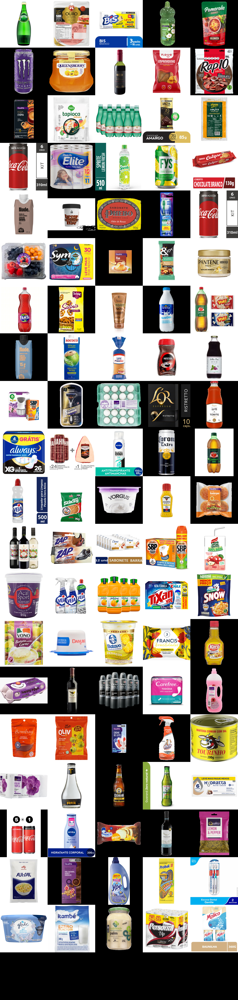

In [ ]:
mosaic(best_cart)